In [1]:
import os
import sys
import subprocess
import numpy as np
from IPython.display import Image, display


Note that the working directory will be set to ```main_dir``` (the base directory), not the notebooks directory. <br>
Libraries such as GPA and Force-Matching are located in ```scripts``` directory. <br>
So, change the working directory to ```os.chdir("scripts")``` or ```os.chdir("scripts/ForceMatching")``` for running GPA or Force-Matching in this notebook.

In [2]:
lib_dir = os.getcwd()
if "notebooks" in lib_dir:
    lib_dir = os.path.join(lib_dir[:-10], 'PROFET')
elif lib_dir == "/content":
    lib_dir = lib_dir + "/GPA-source_code"
os.chdir(lib_dir)
print(lib_dir)

main_dir = os.path.dirname(lib_dir)
sys.path.insert(0, main_dir)  # for util.utils
sys.path.insert(0, lib_dir)   # for models.velocityfield
data_dir = os.path.join(main_dir, 'data', '')

os.makedirs(os.path.join(main_dir, 'data'), exist_ok=True)
os.makedirs(os.path.join(main_dir, 'assets'), exist_ok=True)

from util.utils import (
    ResourceMonitor, contrast_colors,
    reduce_dimension, save_preprocessed_data, load_preprocessed_data, visualize_data,
    generate_animation, generate_W2distance_plot,
)

/Users/hyemin/Documents/source_code/ongoing/Trajectory-Inference/PROFET/PROFET
[KeOps] Warning : CUDA libraries not found or could not be loaded; Switching to CPU only.
[KeOps] Warning : OpenMP library not found, it must be downloaded through Homebrew for apple Silicon chips
[KeOps] Warning : OpenMP support is not available. Disabling OpenMP.


## EMT dataset

### Data property

* 6 snapshots at different timepoints (day 0, 1, 2, 3, 4, 8)
* 72 genes · 12,588 total cells
* Training timepoints: `times=[0, 4]`, `d_red=2`
* Cells per training tp: Day 0: 2,734 · Day 4: 1,147
* Held-out / Intermediate: Day 1: 2,303 · Day 2: 2,381 · Day 3: 2,132 · Day 8: 1,891

### Data structure
Datasets are located in `data/EMT_72genes` directory.

* `submatrix_72_genes_expression_matrix.txt` : Raw data matrix in $\mathbb{R}^{M \times N}$ composed of $M$ rows for individual samples and $N$ columns of different genes.
* `EMT_Cells_Days_matrix.txt` : The entire dataset is divided into 6 classes which correspond to different days.

In [3]:
# Preprocessing function
def load_emt_dataset():
    import pandas as pd

    # gene_expression dataset => full_matrix
    GE_matrix_file = data_dir + 'EMT_72genes/submatrix_72_genes_expression_matrix.txt'
    if os.path.exists(GE_matrix_file):
        df = pd.read_table(GE_matrix_file, sep="\t")
        print(df)
        full_matrix = np.array(df)[:,1:]
    else:
        print("If full gene expression matrix is stored in the directory, load and view it.")

    # time information => time_label
    time_info_file = data_dir + 'EMT_72genes/EMT_Cells_Days_matrix.txt'
    df_cls = pd.read_table(time_info_file, sep="\t")
    time_label = np.array(df_cls['day'])
    print("classes:", set(time_label))
        
    return full_matrix, time_label

       Unnamed: 0      ZEB1       VIM       AXL      MMP2    ANTXR2       FN1  \
0               0  0.011424  3.265508  0.164112  0.324970  0.063659  2.326014   
1               1  0.105767  3.489770  0.204251  0.287763  0.163092  1.503221   
2               2  0.046734  3.622863  0.389222  0.235552  0.087234  2.111502   
3               3  0.103840  3.301565  0.066758  0.281401  0.054008  1.991090   
4               4  0.033904  2.958273 -0.004628  0.377388  0.080955  2.491609   
...           ...       ...       ...       ...       ...       ...       ...   
12583       12583  0.450887  3.724462  0.450887  0.760528  0.000000  2.956498   
12584       12584  0.000000  3.876603  0.000000  0.000000  0.000000  2.919033   
12585       12585  0.492954  3.001434  0.492954  0.000000  0.492954  0.821668   
12586       12586  0.000000  3.509244  0.000000  0.000000  0.000000  0.000000   
12587       12587  0.000000  3.334908  0.990373  0.755257  0.447297  2.305109   

           NRP1     TGFBI  

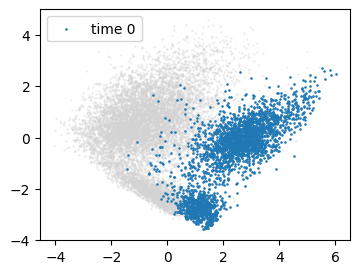

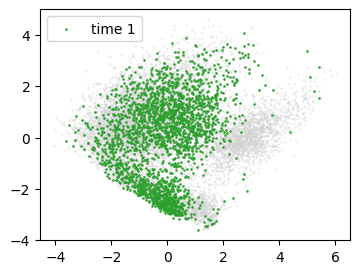

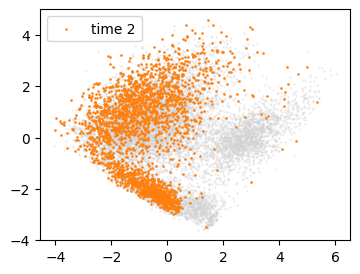

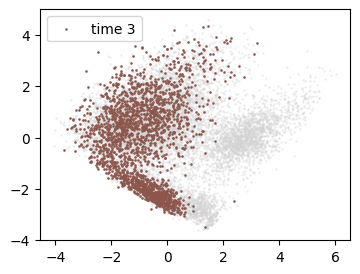

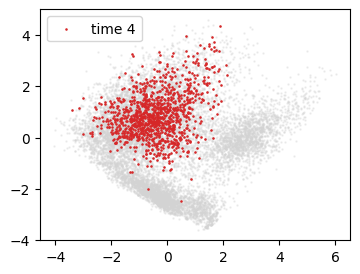

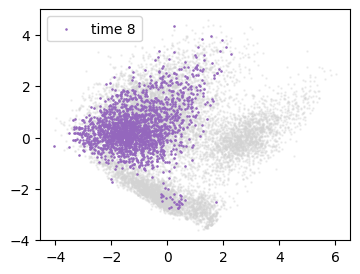

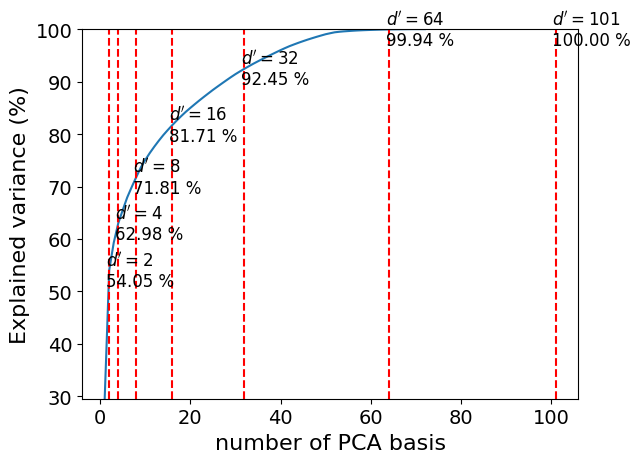

In [4]:
# Data preprocess
example_name = 'emt_72' # 
d_reds = [2, 4, 8, 16,32, 64,101] # [] or list of reduced dimensions
    
full_matrix, time_label = load_emt_dataset()
visualize_data(full_matrix, time_label, colors=contrast_colors)
try:
    pca, projected_matrix = reduce_dimension(full_matrix, d_reds, example_name)
    data = {'full_matrix': full_matrix, 'time_label': time_label, 'pca': pca, 'projected_matrix': projected_matrix}
except:
    data = {'full_matrix': full_matrix, 'time_label': time_label}
save_preprocessed_data(data, example_name)

In [5]:
from collections import Counter
cnt = Counter(time_label)

In [6]:
# Load precomputed preprocessed data
try:
    time_label, full_matrix, projected_matrix, pca = load_preprocessed_data(example_name)
except:
    time_label, full_matrix = load_preprocessed_data(example_name)

time_points = sorted(list(set(time_label)))

## PROFET

In [7]:
# PROFET step 1: GPA
d_red = 2
times = [0, 4]
dimension_reduction = 'Y'
exp_no = "test"
exp_memo = f"dim{d_red}_{exp_no}"

result_dir = os.path.join(main_dir, "assets", example_name, exp_memo)
os.makedirs(result_dir, exist_ok=True)

# tunable parameters
adjust_lr_P_epochs = 'Y'    # 'Y' to auto-adjust lr_P and epochs w.r.t. dimensionality
                            # 'N' to use specified lr_P and epochs below
lr_P = 0.0025
epochs = 5000
specify_f_Lip_threshold = 'Y'    # 'Y' to stop when f_Lip divergence < threshold
f_Lip_threshold = 1e-4

In [8]:
os.chdir(lib_dir)

dimension_note = f'dim{d_red}-' if dimension_reduction in ['Y', 'yes'] else ''

with ResourceMonitor() as monitor:
    for i in range(len(times) - 1):
        cmd = (
            f"python3 run_GPA.py"
            f" --dataset {example_name}"
            f" --label {times[i]} {times[i+1]}"
            f" --N_dim {d_red}"
            f" --exp_no {exp_no}"
            f" --dimension_reduction {dimension_reduction}"
        )
        if adjust_lr_P_epochs in ['N', 'no']:
            cmd += f" --adjust_lr_P_epochs {adjust_lr_P_epochs} -lr_P {lr_P} --epochs {epochs}"
        if specify_f_Lip_threshold in ['Y', 'yes']:
            cmd += f" --f_Lip_threshold {f_Lip_threshold}"
        subprocess.run(cmd, shell=True, check=True)

monitor.report("PROFET GPA", dataset=example_name, d_red=d_red,
               filename=os.path.join(result_dir, "resources.txt"))

Data prepared.
Example specific step size = 0.003120196536596738
total time 119.336s
Results saved at: /Users/hyemin/Documents/source_code/ongoing/Trajectory-Inference/PROFET/assets/emt_72/KL-Lipschitz_1.0000-0_4times-dim2-1147_2734-00-test.pickle
[PROFET GPA] Wall-clock time : 123.56 s
[PROFET GPA] Peak GPU memory : N/A (no CUDA device)
[PROFET GPA] Peak CPU RAM    : 0.473 GB
[PROFET GPA] Dataset         : emt_72
[PROFET GPA] Dimensionality  : 2


In [9]:
# PROFET step 2: Force-Matching
intermediate_times = [2]

if dimension_reduction in ['Y', 'yes']:
    dimension_note = f'dim{d_red}-'
else:
    dimension_note = ''
gpa_filenames = [
    f'KL-Lipschitz_1.0000-{times[0]}_{times[1]}times-{dimension_note}{cnt[times[1]]:04d}_{cnt[times[0]]:04d}-00-{exp_no}.pickle',
]

gpa_filenames_join = " ".join(gpa_filenames)
times_join = " ".join([str(t) for t in times])


In [10]:
os.chdir(lib_dir)
cmd = (
    f"python3 run_ForceMatching.py"
    f" --dataset {example_name}"
    f" --ts {times_join}"
    f" --exp_memo {exp_memo}"
    f" --files {gpa_filenames_join}"
)

with ResourceMonitor() as monitor:
    subprocess.run(cmd, shell=True, check=True)

monitor.report("PROFET ForceMatching", dataset=example_name, d_red=d_red,
               filename=os.path.join(result_dir, "resources.txt"))

GPA time = [0.0, 5.114002123482053], Physical time = [0.0, 4.0], Converted time = [0.0, 5.114002123482053]
Iteration 2000, Loss: 0.026192
Iteration 4000, Loss: 0.018118
Iteration 6000, Loss: 0.018707
Iteration 8000, Loss: 0.013810
Iteration 10000, Loss: 0.011961
Iteration 12000, Loss: 0.010774
Iteration 14000, Loss: 0.009677
Iteration 16000, Loss: 0.012703
Iteration 18000, Loss: 0.006165
Iteration 20000, Loss: 0.006028
Results saved at: /Users/hyemin/Documents/source_code/ongoing/Trajectory-Inference/PROFET/assets/emt_72/dim2_test/
Total time: 156.38302969932556 sec
[PROFET ForceMatching] Wall-clock time : 159.17 s
[PROFET ForceMatching] Peak GPU memory : N/A (no CUDA device)
[PROFET ForceMatching] Peak CPU RAM    : 0.184 GB
[PROFET ForceMatching] Dataset         : emt_72
[PROFET ForceMatching] Dimensionality  : 2


In [11]:
from models.velocityfield import VelocityField

# load velocityfield
velocity_net, p = VelocityField.load(os.path.join(main_dir, "assets", example_name, exp_memo, ""))

# integrate ODE
dt = p['numerical_ts'][-1]/200
numerical_dt = dt
physical_dt = dt * p['ts'][-1] / p['numerical_ts'][-1]
input_data = full_matrix[time_label==0,:] if dimension_reduction in ['N', 'no'] else projected_matrix[time_label==0, :d_red]
X1_trpts = velocity_net.integrate(input_data, T=p['numerical_ts'][-1], dt=dt)

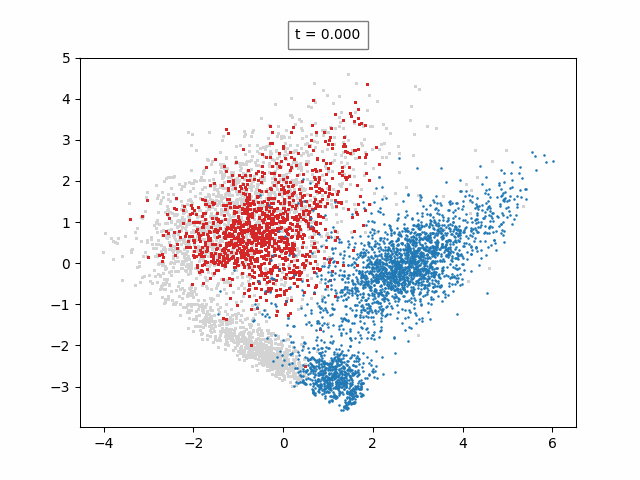

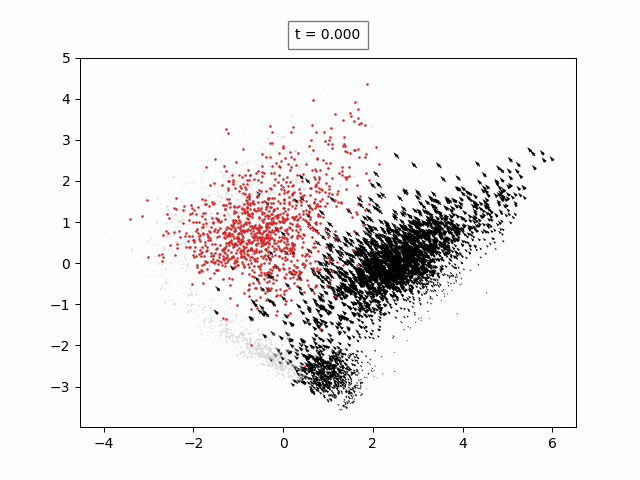

Sample size (2734) exceeds threshold (2000). Subsampling to 2000 points for W2 computation.
minimum values are obtained at x= [0.0, 3.38, 4.0]


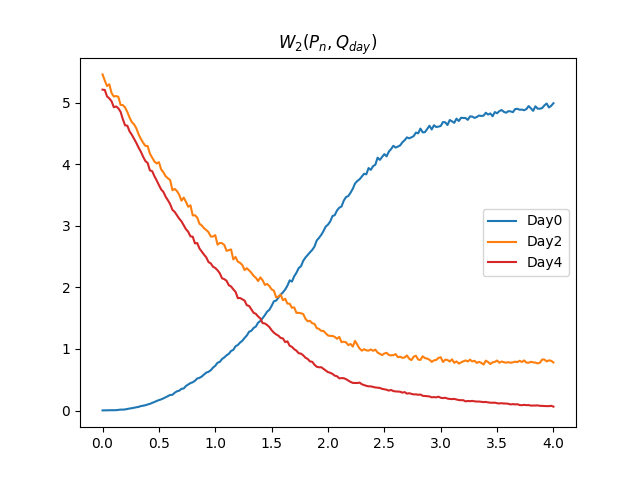

<Figure size 640x480 with 0 Axes>

In [12]:
img_src1 = os.path.join(main_dir, "assets", example_name, f"{exp_memo}-movie-particles.gif")
img_src2 = os.path.join(main_dir, "assets", example_name, f"{exp_memo}-movie-velocities.gif")
img_src3 = os.path.join(main_dir, "assets", example_name, f"{exp_memo}-w2distances.png")

generate_animation(example_name, times, intermediate_times, X1_trpts,
                   img_src1, d_red, True, colors=contrast_colors, plot_vectorfield=False)
display(Image(filename=img_src1))

generate_animation(example_name, times, intermediate_times, X1_trpts,
                   img_src2, d_red, True, colors=contrast_colors, plot_vectorfield=True)
display(Image(filename=img_src2))

generate_W2distance_plot(example_name, times, intermediate_times, X1_trpts,
                         img_src3, d_red, True, colors=contrast_colors)
display(Image(filename=img_src3))

## Downstream Analysis — Trajectory Visualization and Subtrajectory Classification

Visualizes full reconstructed trajectories and classifies them into subtrajectories based on **ancestral cell state** (source clustering) for the EMT dataset.

**Prerequisites:**
- PROFET section above must have been run so that `X1_trpts`, `p`, `physical_dt`, `full_matrix`, `time_label`, `time_points`, `projected_matrix`, and `pca` are in scope.
- The cluster labels (`{exp_memo}_X2_hat_clusters.csv`) generated here are required by the Gene Expression Dynamics section below.

In [ ]:
import pandas as pd
from sklearn import decomposition
from util.downstream import (
    generate_static_trajectory_plots_two_timepoints,
    classify_X2_hat,
    generate_static_cluster_plot_source,
)

# d_red-component PCA for trajectory visualization and inverse_transform
pca_d = decomposition.PCA(n_components=d_red, random_state=0)
pca_d.fit(full_matrix)

# Per-timepoint full expression matrices
mats = {t: full_matrix[time_label == t].astype(float) for t in time_points}

source_t, target_t = times[0], times[-1]  # 0, 4
optimal_k = 2   # number of subtrajectory classes; adjust based on biology
start_i = 0
index = 10

### Static Trajectory Visualization

Generates static scatter plots of the full reconstructed trajectory: one with trajectory snapshots (coloured by time via viridis gradient) and one showing only the training/test data snapshots.

In [ ]:
output_with = os.path.join(result_dir, f"{exp_memo}_static_trajectory_with_snapshots.png")
output_without = os.path.join(result_dir, f"{exp_memo}_static_trajectory_without_snapshots.png")

generate_static_trajectory_plots_two_timepoints(
    pca=pca_d,
    physical_dt=physical_dt,
    days=times,
    intermediate_days=intermediate_times,
    X1_trpts=X1_trpts,
    mats=mats,
    d_red=d_red,
    output_file_with_snapshots=output_with,
    output_file_without_snapshots=output_without,
)
display(Image(filename=output_with))
display(Image(filename=output_without))

### Subtrajectory Classification by Ancestral State

Clusters cells at the **source** time point into `optimal_k` groups using K-means, then assigns each trajectory to the ancestral cluster it started from. Produces an animated GIF of trajectories coloured by ancestor group and a static initial-state figure.

In [ ]:
output_gif = os.path.join(result_dir, f"{exp_memo}_classify_x2_hat_trajectory.gif")
output_png = os.path.join(result_dir, f"{exp_memo}_ancestral_state_with_background_x2.png")

classify_X2_hat(
    full_matrix, pca_d, source_t, target_t, X1_trpts, mats,
    optimal_k, start_i, index, p,
    reverse=False, intermediate_t=intermediate_times,
    d_red=d_red, random_state=42, exp_memo=exp_memo,
    output_file=output_gif, output_file_2=output_png,
)
display(Image(filename=output_png))

### Static Subtrajectory Plot (by Ancestral State)

Generates a static plot of all trajectory snapshots coloured by ancestral subgroup. Cluster labels are saved to `{exp_memo}_X2_hat_clusters.csv` for use in the Gene Expression Dynamics section below.

In [ ]:
cluster_output_file = os.path.join(result_dir, f"{exp_memo}_static_cluster_plot_source.png")

X2_hat_labels = generate_static_cluster_plot_source(
    pca_d, source_t, target_t, X1_trpts, mats,
    optimal_k, start_i, index=1, p=p,
    reverse=False, intermediate_t=intermediate_times,
    d_red=d_red, random_state=42, exp_memo=exp_memo,
    output_file=cluster_output_file,
)
display(Image(filename=cluster_output_file))

# Save cluster labels
cluster_save_path = os.path.join(result_dir, f"{exp_memo}_X2_hat_clusters.csv")
df_clusters = pd.DataFrame({
    "Cell_Index": np.arange(len(X2_hat_labels)),
    "Cluster_Label": X2_hat_labels,
})
df_clusters.to_csv(cluster_save_path, index=False)
print(f"Cluster labels saved to {cluster_save_path}")

## Downstream Analysis — Reconstruction of Gene Expression Dynamics

The following cells reconstruct gene expression dynamics in the original high-dimensional gene space using the PROFET trajectory inferred above.

**Prerequisites:**
- Preprocessing and PROFET sections above must have been run (or loaded) so that `X1_trpts`, `velocity_net`, `p`, `full_matrix`, `time_label`, `time_points`, `projected_matrix`, and `pca` are in scope.
- Subtrajectory cluster file (`{exp_memo}_X2_hat_clusters.csv`) must exist in `result_dir` — generated by the trajectory visualisation / subtrajectory classification notebook.

In [ ]:
# Downstream analysis setup
import pandas as pd
from sklearn import decomposition

# d_red-component PCA for gene expression reconstruction via inverse_transform
pca_d = decomposition.PCA(n_components=d_red, random_state=0)
pca_d.fit(full_matrix)

# Per-timepoint full expression matrices
mats = {t: full_matrix[time_label == t].astype(float) for t in time_points}

# Gene names from the expression matrix file
gene_file = data_dir + 'EMT_72genes/submatrix_72_genes_expression_matrix.txt'
df_genes = pd.read_table(gene_file, sep="\t")
gene_names = df_genes.columns[1:].tolist()
print(f"Number of genes: {len(gene_names)}")

# Import downstream analysis functions
from util.downstream import (
    Average_gene_dynamics_whole_saveonly,
    Average_gene_dynamics_whole_saveonly_with_violin_plot_sample1_EMT,
    Compute_and_Plot_FoldChange_MeanDiff_PValues,
    difference_of_means_emt,
    Average_gene_dynamics_whole_saveonly_single_trajectory_EMT,
    Compare_Distribution_Trajectories_Intermediate_EMT,
)

source_t, target_t = times[0], times[-1]  # 0, 4
intermediate_t = intermediate_times        # [2]
max_i = 200
index = 1

### Average Gene Dynamics

Mean gene expression over time for each gene, reconstructed from PROFET trajectories, with a 95% confidence interval. Compared against observed means at source, intermediate, and target time points.

In [ ]:
for gene in gene_names:
    print(f"Processing gene: {gene}")
    try:
        img_src = os.path.join(result_dir, f"average_gene_expression_{gene}.png")
        Average_gene_dynamics_whole_saveonly(
            pca_d, gene_names, source_t, target_t, X1_trpts, mats,
            gene, index, p, max_i,
            intermediate_t=intermediate_t, img_src=img_src,
        )
    except Exception as e:
        print(f"  Error: {e}")

### Average Gene Dynamics by Subtrajectory

Mean gene expression per subtrajectory (classified by ancestor cell state) with violin plots showing the distribution at each time point. Requires subtrajectory cluster annotations saved at `{result_dir}/{exp_memo}_X2_hat_clusters.csv` from the trajectory visualisation notebook.

In [ ]:
cluster_save_path = os.path.join(result_dir, f"{exp_memo}_X2_hat_clusters.csv")

for gene in gene_names:
    print(f"Processing gene: {gene}")
    try:
        img_src = os.path.join(result_dir, f"subtrajectories_violin_{gene}.png")
        Average_gene_dynamics_whole_saveonly_with_violin_plot_sample1_EMT(
            pca_d, gene_names, source_t, target_t, X1_trpts, mats,
            gene, index, p, max_i,
            intermediate_t=intermediate_t, img_src=img_src,
            cluster_save_path=cluster_save_path,
        )
    except Exception as e:
        print(f"  Error: {e}")

### Statistical Analysis: Fold Change, Mean Differences, p-values

Computes per-gene statistics across subtrajectories and saves CSVs + plots to `result_dir/subtraj/`.

In [ ]:
subtraj_dir = os.path.join(result_dir, 'subtraj')
os.makedirs(subtraj_dir, exist_ok=True)

for gene in gene_names:
    Compute_and_Plot_FoldChange_MeanDiff_PValues(
        pca_d, gene_names, X1_trpts, gene, index, p, max_i,
        subtraj_dir=subtraj_dir,
        cluster_save_path=cluster_save_path,
    )

difference_of_means_emt(gene_names, subtraj_dir)

### Single-Cell Gene Expression Dynamics

Plots gene expression trajectories for every individual cell, grouped by subtrajectory class.

In [ ]:
for gene in gene_names:
    print(f"Processing gene: {gene}")
    try:
        subgroup_output_file = os.path.join(result_dir, f"single_cell_trajectories_{gene}.png")
        Average_gene_dynamics_whole_saveonly_single_trajectory_EMT(
            pca_d, gene_names, source_t, target_t, X1_trpts, mats,
            gene, index, p, max_i,
            intermediate_t=intermediate_t,
            subgroup_output_file=subgroup_output_file,
            cluster_save_path=cluster_save_path,
        )
    except Exception as e:
        print(f"  Error: {e}")

### Distribution Comparison at Intermediate Time Points

KDE density plots comparing predicted gene expression distributions from PROFET trajectories against observed data at the intermediate time point (day 2).

In [ ]:
for gene in gene_names:
    print(f"Processing gene: {gene}")
    try:
        output_file = os.path.join(result_dir, f"KDE_distribution_{gene}.png")
        Compare_Distribution_Trajectories_Intermediate_EMT(
            pca_d, gene_names, source_t, target_t, X1_trpts, mats,
            gene, p, intermediate_t=intermediate_t, output_file=output_file,
        )
    except Exception as e:
        print(f"  Error: {e}")